In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

from denoise import *

In [2]:
%matplotlib inline

Load in a sample MRAW clip.

In [3]:
filename = r"C:\Users\plt18\OneDrive - Imperial College London\200W_320us_48um_pretest_C001H001S0001\200W_320us_48um_pretest_C001H001S0001.cihx"

In [4]:
images,cih = load_video(filename)

e:\patrick\work\.vscode\denoise.py:63: UserWarning: Clipped footage! (Total frame: 8566, Original total frame: 93138)
  warnings.warn('Clipped footage! (Total frame: {}, Original total frame: {})'.format(cih['Total Frame'], cih['Original Total Frame'] ))


Create a simple transformer class.

In [7]:
class PreTransformer():
    def __init__(self,frames):
        self.fit_1(frames)
    
    def fit_1(self,frames):
        self.norm = frames.max()

    def transform_1(self,frames):
        # Transform to values between 0 and 1
        return np.log2(1.+frames/self.norm)
    
    def inverse_1(self,frames):
        return (2**frames - 1)*self.norm
    
    def fit_2(self,frames,scale="std"):
        self.mean = frames.mean()
        if scale=="std":
            self.scale = frames.std()
        elif scale=="norm":
            self.scale = self.norm
        else:
            self.scale = 1.
    
    def transform_2(self,frames):
        return (frames-self.mean)/self.scale
    
    def inverse_2(self,frames):
        return frames*self.scale + self.mean
    
    def transform(self,frames):
        # Apply both transformations
        return self.transform_2(self.transform_1(frames))
    

In [8]:
transformer = PreTransformer(images[:1000])
#transformer.fit_1(images[:1000])
transformer.fit_2(transformer.transform_1(images[:1000]),scale="norm")
images_tr = transformer.transform_2(images)

Where are the brightest images?

Text(0, 0.5, 'Max pixel value')

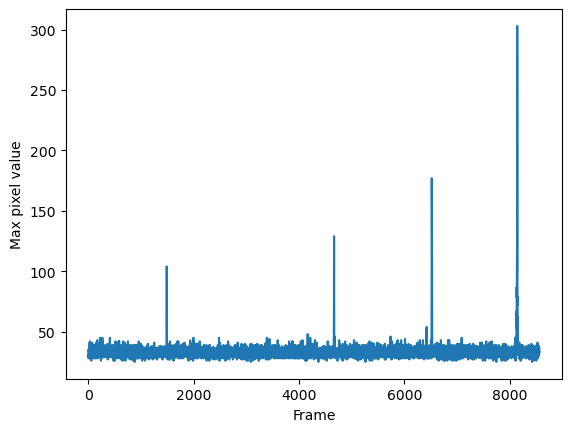

In [40]:
plt.plot(
    np.max(images,axis=(-2,-1))
)
plt.xlabel('Frame')
plt.ylabel('Max pixel value')

Look at a close-up centered around the brightest peak. 

In [42]:
start = 8110
end = 8170

Text(0, 0.5, 'Max transformed pixel value')

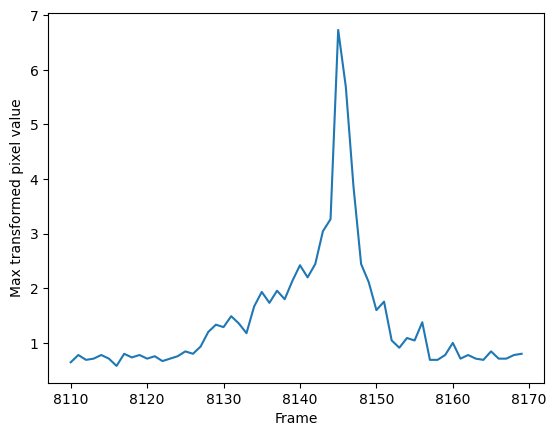

In [43]:
plt.plot(
    np.arange(start,end),
    np.max(images_tr[start:end,:,:],axis=(-2,-1))
)
plt.xlabel('Frame')
plt.ylabel('Max transformed pixel value')

View a small section of video.

In [15]:
fig = plt.figure()
im = plt.imshow(images_tr[0,:,:],vmin=0.,vmax=7.0)
txt = plt.text(0,-10,"")
plt.close()

In [16]:
def init():
    im.set_data(images_tr[0,:,:])

def animate(i):
    im.set_data(images_tr[i,:,:])
    txt.set_text("{}".format(i))
    return im

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=range(start,end),
                               interval=33,cache_frame_data=False,repeat=False)

In [17]:
HTML(anim.to_jshtml())

## Denoising
Denoising uses the BM4D package. This requires a PSD calculated on a 'uninteresting' sample of the video. 

In [18]:
import bm4d
from scipy.signal import welch

Get FFT

In [19]:
from scipy import fft

In [20]:
images_ft = fft.fftn(images_tr[:1000],workers=-1)

In [21]:
psd_r = (np.imag(images_ft)**2+np.real(images_ft)**2)

In [22]:
from scipy.interpolate import interp1d

In [23]:
images_tr_sample = images_tr[start:end,:,:]

In [24]:
psd_f = interp1d((images_tr_sample.shape[0]-1)/(psd_r.shape[0]-1)*np.arange(psd_r.shape[0]),psd_r,axis=0,copy=False)(np.arange(images_tr_sample.shape[0]))*np.prod(images_tr_sample.shape)

Now apply BM4D algorithm.

In [25]:
images_denoised = bm4d.bm4d(images_tr_sample,psd_f)

In [28]:
images_denoised -= images_denoised.min()
images_denoised /= images_denoised.max()

Plot the denoised video

In [29]:
fig = plt.figure()
im = plt.imshow(images_denoised[0,:,:],vmin=0.,vmax=1.0)
plt.close()

In [30]:
def init():
    im.set_data(images_denoised[0,:,:])

def animate(i):
    im.set_data(images_denoised[i,:,:])
    return im

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=np.arange(images_denoised.shape[0]),
                               interval=33,cache_frame_data=False,repeat=False)

In [31]:
HTML(anim.to_jshtml())

Plot a graph of the maximum pixel values in the denoised clip. 

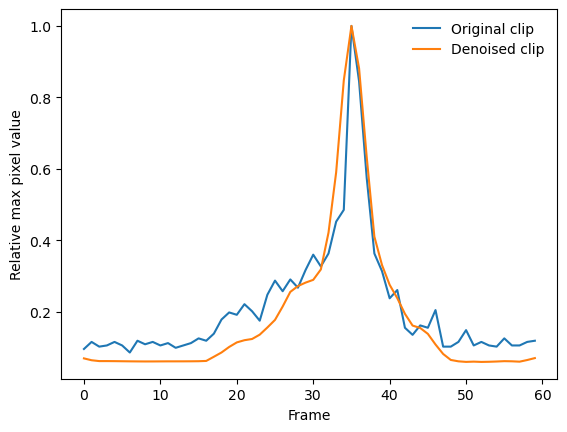

In [38]:
plt.plot(np.max(images_tr_sample,axis=(-2,-1))/images_tr_sample.max(),
         label='Original clip')
plt.plot(np.max(images_denoised,axis=(-2,-1)),
         label='Denoised clip')
plt.xlabel('Frame')
plt.ylabel('Relative max pixel value')
plt.legend(frameon=False)

Testing - load saved MRAWs

In [35]:
test,_ = pyMRAW.load_video(r"E:\patrick\work\.vscode\videos\200W_320us_48um_pretest_C001H001S0001_denoised.cih")

In [36]:
cih

{'Date': '2023/5/25',
 'Camera Type': 'FASTCAM SA5 model 775K-M1',
 'Record Rate(fps)': 100000.0,
 'Shutter Speed(s)': 100000.0,
 'Total Frame': 8566,
 'Original Total Frame': 93138,
 'Image Width': 320,
 'Image Height': 192,
 'File Format': 'Mraw',
 'EffectiveBit Depth': 12,
 'EffectiveBit Side': 'Lower',
 'Color Bit': 12,
 'Comment Text': ''}